In [1]:
from __future__ import print_function, division
import os
import torch
import pandas as pd
from skimage import io, transform
import numpy as np
import matplotlib.pyplot as plt

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

plt.ion()   # interactive mode

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import sys
sys.path.insert(0, '../')

# Training a simple network

## Constructing the network

In [4]:
from torch import nn
from torch.nn import init
import torch.nn.functional as F

In [5]:
class BaseNet(nn.Module):

    def __init__(self, input_shape, output_shape):
        super(BaseNet, self).__init__()
        
        self.output_shape = output_shape
        self.input_shape = input_shape

        C, W, H = input_shape
        P, D = output_shape

        self.features = nn.Sequential(
            nn.Linear(C*W*H, 300),
            nn.ReLU(inplace=True),
        )

        self.classifier = nn.Sequential(
            nn.Linear(300, P*D)
        )

    def forward(self, x):
        C, W, H = self.input_shape
        P, D = self.output_shape
        
        x = x.view(-1, C*W*H) # C x W x H -> C * W * H
        
        x = self.features(x)

        x = self.classifier(x)
        

        return x.view(-1, P, D)


## Loading the dataset and splitting between train and valid

In [6]:
from cpe775.dataset import FaceLandmarksDataset
from torch.utils.data.sampler import SubsetRandomSampler
from torchvision.transforms import Compose
from cpe775.transforms import ToTensor, CropFace, ToGray

In [7]:
batch_size = 32
random_seed = 42
valid_size = 0.2
shuffle = True

In [8]:
transforms = Compose([
                   CropFace(enlarge_ratio=1.7),
                   ToGray(),
                   ToTensor()
                 ])

In [9]:
# load the dataset
dataset = FaceLandmarksDataset(csv_file='../data/train.csv',
                               root_dir='../data/',
                               transform=transforms)

num_train = len(dataset)
indices = list(range(num_train))
split = int(np.floor(valid_size * num_train))

if shuffle == True:
    np.random.seed(random_seed)
    np.random.shuffle(indices)

train_idx, valid_idx = indices[split:], indices[:split]

train_sampler = SubsetRandomSampler(train_idx)
valid_sampler = SubsetRandomSampler(valid_idx)

train_loader = torch.utils.data.DataLoader(dataset, 
                batch_size=batch_size, sampler=train_sampler, num_workers=4)

valid_loader = torch.utils.data.DataLoader(dataset, 
                batch_size=batch_size, sampler=valid_sampler, num_workers=4)

## Creating the model

In [10]:
net = BaseNet((1, 256, 256), (68, 2)) # input shape, output shape

In [11]:
net = torch.nn.DataParallel(net)
net = net.cuda()

## Creating the loss function

In [12]:
from cpe775.criterion import RMSELoss

In [13]:
criterion = RMSELoss()
criterion = criterion.cuda()

## Loading trainer

In [14]:
from cpe775.model import Model

In [15]:
 model = Model(net, criterion=criterion)

## Creating the optimizer

In [16]:
import torch

In [17]:
optimizer = torch.optim.SGD(net.parameters(), 0.01, momentum=0.9)

## Configuring

In [18]:
model.set_optimizer(optimizer)

## Setting callbacks

In [19]:
from cpe775 import callbacks

In [20]:
callback_list = [
        callbacks.Progbar(print_freq=40),
        callbacks.ModelCheckpoint('../results/basenet/checkpoint-v2.pth.tar', 'val_loss', mode='min')
    ]

## Performing the training

In [21]:
model.fit_loader(train_loader, 400, val_loader=valid_loader,
                 callback=callbacks.Compose(callback_list))

Epoch: [0][0/79]	Time 7.709 (7.709)	Data 1.281 (1.281)	Train Loss 2.138 (2.138)	
Epoch: [0][40/79]	Time 0.855 (0.452)	Data 0.819 (0.248)	Train Loss 0.600 (1.038)	
Val: [0/20]	Time 1.457 (1.457)	Data 1.426 (1.426)	Val Loss 0.646 (0.646)	
Epoch: [1][0/79]	Time 1.539 (1.539)	Data 1.500 (1.500)	Train Loss 0.536 (0.536)	
Epoch: [1][40/79]	Time 0.065 (0.311)	Data 0.001 (0.265)	Train Loss 0.437 (0.565)	
Val: [0/20]	Time 1.410 (1.410)	Data 1.380 (1.380)	Val Loss 0.915 (0.915)	
Epoch: [2][0/79]	Time 1.421 (1.421)	Data 1.383 (1.383)	Train Loss 0.944 (0.944)	
Epoch: [2][40/79]	Time 0.063 (0.329)	Data 0.000 (0.282)	Train Loss 0.568 (0.665)	
Val: [0/20]	Time 1.013 (1.013)	Data 0.982 (0.982)	Val Loss 0.445 (0.445)	
Epoch: [3][0/79]	Time 1.167 (1.167)	Data 1.131 (1.131)	Train Loss 0.436 (0.436)	
Epoch: [3][40/79]	Time 0.253 (0.314)	Data 0.217 (0.268)	Train Loss 0.327 (0.458)	
Val: [0/20]	Time 1.298 (1.298)	Data 1.267 (1.267)	Val Loss 0.345 (0.345)	
Epoch: [4][0/79]	Time 1.620 (1.620)	Data 1.580 (1.58

Val: [0/20]	Time 1.718 (1.718)	Data 1.687 (1.687)	Val Loss 0.128 (0.128)	
Epoch: [35][0/79]	Time 1.475 (1.475)	Data 1.438 (1.438)	Train Loss 0.144 (0.144)	
Epoch: [35][40/79]	Time 0.373 (0.332)	Data 0.340 (0.287)	Train Loss 0.122 (0.147)	
Val: [0/20]	Time 1.233 (1.233)	Data 1.202 (1.202)	Val Loss 0.139 (0.139)	
Epoch: [36][0/79]	Time 1.933 (1.933)	Data 1.896 (1.896)	Train Loss 0.142 (0.142)	
Epoch: [36][40/79]	Time 0.065 (0.344)	Data 0.000 (0.298)	Train Loss 0.120 (0.131)	
Val: [0/20]	Time 1.360 (1.360)	Data 1.330 (1.330)	Val Loss 0.145 (0.145)	
Epoch: [37][0/79]	Time 1.264 (1.264)	Data 1.228 (1.228)	Train Loss 0.121 (0.121)	
Epoch: [37][40/79]	Time 0.742 (0.329)	Data 0.708 (0.285)	Train Loss 0.137 (0.131)	
Val: [0/20]	Time 1.294 (1.294)	Data 1.262 (1.262)	Val Loss 0.154 (0.154)	
Epoch: [38][0/79]	Time 1.559 (1.559)	Data 1.519 (1.519)	Train Loss 0.139 (0.139)	
Epoch: [38][40/79]	Time 0.062 (0.316)	Data 0.000 (0.273)	Train Loss 0.123 (0.133)	
Val: [0/20]	Time 1.191 (1.191)	Data 1.160 (1

Epoch: [69][0/79]	Time 1.308 (1.308)	Data 1.271 (1.271)	Train Loss 0.102 (0.102)	
Epoch: [69][40/79]	Time 0.129 (0.321)	Data 0.096 (0.279)	Train Loss 0.126 (0.131)	
Val: [0/20]	Time 1.534 (1.534)	Data 1.503 (1.503)	Val Loss 0.146 (0.146)	
Epoch: [70][0/79]	Time 1.787 (1.787)	Data 1.751 (1.751)	Train Loss 0.122 (0.122)	
Epoch: [70][40/79]	Time 0.063 (0.314)	Data 0.001 (0.267)	Train Loss 0.125 (0.122)	
Val: [0/20]	Time 1.648 (1.648)	Data 1.617 (1.617)	Val Loss 0.159 (0.159)	
Epoch: [71][0/79]	Time 1.196 (1.196)	Data 1.160 (1.160)	Train Loss 0.128 (0.128)	
Epoch: [71][40/79]	Time 0.465 (0.326)	Data 0.431 (0.282)	Train Loss 0.112 (0.128)	
Val: [0/20]	Time 1.365 (1.365)	Data 1.334 (1.334)	Val Loss 0.145 (0.145)	
Epoch: [72][0/79]	Time 1.649 (1.649)	Data 1.613 (1.613)	Train Loss 0.134 (0.134)	
Epoch: [72][40/79]	Time 0.063 (0.324)	Data 0.001 (0.276)	Train Loss 0.107 (0.131)	
Val: [0/20]	Time 1.537 (1.537)	Data 1.506 (1.506)	Val Loss 0.142 (0.142)	
Epoch: [73][0/79]	Time 1.244 (1.244)	Data 1.

Epoch: [103][40/79]	Time 0.081 (0.316)	Data 0.046 (0.275)	Train Loss 0.136 (0.136)	
Val: [0/20]	Time 1.199 (1.199)	Data 1.168 (1.168)	Val Loss 0.137 (0.137)	
Epoch: [104][0/79]	Time 1.309 (1.309)	Data 1.273 (1.273)	Train Loss 0.127 (0.127)	
Epoch: [104][40/79]	Time 0.535 (0.326)	Data 0.500 (0.281)	Train Loss 0.111 (0.125)	
Val: [0/20]	Time 1.709 (1.709)	Data 1.678 (1.678)	Val Loss 0.129 (0.129)	
Epoch: [105][0/79]	Time 1.321 (1.321)	Data 1.285 (1.285)	Train Loss 0.108 (0.108)	
Epoch: [105][40/79]	Time 0.343 (0.322)	Data 0.309 (0.281)	Train Loss 0.132 (0.120)	
Val: [0/20]	Time 1.364 (1.364)	Data 1.333 (1.333)	Val Loss 0.136 (0.136)	
Epoch: [106][0/79]	Time 1.745 (1.745)	Data 1.709 (1.709)	Train Loss 0.131 (0.131)	
Epoch: [106][40/79]	Time 0.285 (0.315)	Data 0.252 (0.273)	Train Loss 0.118 (0.119)	
Val: [0/20]	Time 1.450 (1.450)	Data 1.420 (1.420)	Val Loss 0.148 (0.148)	
Epoch: [107][0/79]	Time 1.534 (1.534)	Data 1.496 (1.496)	Train Loss 0.121 (0.121)	
Epoch: [107][40/79]	Time 0.063 (0.32

Epoch: [137][40/79]	Time 0.064 (0.316)	Data 0.001 (0.267)	Train Loss 0.123 (0.115)	
Val: [0/20]	Time 1.975 (1.975)	Data 1.944 (1.944)	Val Loss 0.146 (0.146)	
Epoch: [138][0/79]	Time 1.460 (1.460)	Data 1.425 (1.425)	Train Loss 0.109 (0.109)	
Epoch: [138][40/79]	Time 0.068 (0.318)	Data 0.033 (0.272)	Train Loss 0.127 (0.120)	
Val: [0/20]	Time 1.428 (1.428)	Data 1.397 (1.397)	Val Loss 0.155 (0.155)	
Epoch: [139][0/79]	Time 1.598 (1.598)	Data 1.563 (1.563)	Train Loss 0.116 (0.116)	
Epoch: [139][40/79]	Time 0.595 (0.333)	Data 0.562 (0.287)	Train Loss 0.119 (0.125)	
Val: [0/20]	Time 1.179 (1.179)	Data 1.149 (1.149)	Val Loss 0.147 (0.147)	
Epoch: [140][0/79]	Time 1.399 (1.399)	Data 1.364 (1.364)	Train Loss 0.100 (0.100)	
Epoch: [140][40/79]	Time 0.159 (0.309)	Data 0.124 (0.267)	Train Loss 0.119 (0.124)	
Val: [0/20]	Time 1.653 (1.653)	Data 1.622 (1.622)	Val Loss 0.143 (0.143)	
Epoch: [141][0/79]	Time 1.710 (1.710)	Data 1.675 (1.675)	Train Loss 0.127 (0.127)	
Epoch: [141][40/79]	Time 0.063 (0.32

Epoch: [171][40/79]	Time 0.358 (0.312)	Data 0.324 (0.270)	Train Loss 0.109 (0.121)	
Val: [0/20]	Time 1.326 (1.326)	Data 1.295 (1.295)	Val Loss 0.145 (0.145)	
Epoch: [172][0/79]	Time 1.402 (1.402)	Data 1.367 (1.367)	Train Loss 0.135 (0.135)	
Epoch: [172][40/79]	Time 0.064 (0.325)	Data 0.000 (0.281)	Train Loss 0.096 (0.122)	
Val: [0/20]	Time 1.393 (1.393)	Data 1.363 (1.363)	Val Loss 0.119 (0.119)	
Epoch: [173][0/79]	Time 1.749 (1.749)	Data 1.713 (1.713)	Train Loss 0.127 (0.127)	
Epoch: [173][40/79]	Time 0.063 (0.341)	Data 0.000 (0.296)	Train Loss 0.130 (0.116)	
Val: [0/20]	Time 1.694 (1.694)	Data 1.662 (1.662)	Val Loss 0.157 (0.157)	
Epoch: [174][0/79]	Time 1.363 (1.363)	Data 1.327 (1.327)	Train Loss 0.108 (0.108)	
Epoch: [174][40/79]	Time 0.063 (0.327)	Data 0.000 (0.281)	Train Loss 0.137 (0.137)	
Val: [0/20]	Time 1.688 (1.688)	Data 1.657 (1.657)	Val Loss 0.176 (0.176)	
Epoch: [175][0/79]	Time 1.227 (1.227)	Data 1.192 (1.192)	Train Loss 0.158 (0.158)	
Epoch: [175][40/79]	Time 0.063 (0.32

Epoch: [205][40/79]	Time 0.171 (0.332)	Data 0.137 (0.288)	Train Loss 0.110 (0.121)	
Val: [0/20]	Time 1.423 (1.423)	Data 1.392 (1.392)	Val Loss 0.156 (0.156)	
Epoch: [206][0/79]	Time 1.800 (1.800)	Data 1.764 (1.764)	Train Loss 0.123 (0.123)	
Epoch: [206][40/79]	Time 0.478 (0.333)	Data 0.442 (0.290)	Train Loss 0.109 (0.120)	
Val: [0/20]	Time 1.327 (1.327)	Data 1.296 (1.296)	Val Loss 0.138 (0.138)	
Epoch: [207][0/79]	Time 1.603 (1.603)	Data 1.568 (1.568)	Train Loss 0.104 (0.104)	
Epoch: [207][40/79]	Time 0.224 (0.315)	Data 0.189 (0.269)	Train Loss 0.106 (0.116)	
Val: [0/20]	Time 1.270 (1.270)	Data 1.239 (1.239)	Val Loss 0.131 (0.131)	
Epoch: [208][0/79]	Time 1.207 (1.207)	Data 1.170 (1.170)	Train Loss 0.100 (0.100)	
Epoch: [208][40/79]	Time 0.675 (0.323)	Data 0.641 (0.276)	Train Loss 0.113 (0.117)	
Val: [0/20]	Time 1.379 (1.379)	Data 1.348 (1.348)	Val Loss 0.127 (0.127)	
Epoch: [209][0/79]	Time 1.616 (1.616)	Data 1.581 (1.581)	Train Loss 0.122 (0.122)	
Epoch: [209][40/79]	Time 0.479 (0.32

Epoch: [239][40/79]	Time 0.175 (0.337)	Data 0.141 (0.293)	Train Loss 0.113 (0.117)	
Val: [0/20]	Time 1.493 (1.493)	Data 1.459 (1.459)	Val Loss 0.154 (0.154)	
Epoch: [240][0/79]	Time 1.362 (1.362)	Data 1.326 (1.326)	Train Loss 0.115 (0.115)	
Epoch: [240][40/79]	Time 0.541 (0.319)	Data 0.506 (0.273)	Train Loss 0.129 (0.130)	
Val: [0/20]	Time 1.463 (1.463)	Data 1.431 (1.431)	Val Loss 0.149 (0.149)	
Epoch: [241][0/79]	Time 1.654 (1.654)	Data 1.617 (1.617)	Train Loss 0.115 (0.115)	
Epoch: [241][40/79]	Time 0.310 (0.332)	Data 0.275 (0.288)	Train Loss 0.100 (0.116)	
Val: [0/20]	Time 1.374 (1.374)	Data 1.343 (1.343)	Val Loss 0.133 (0.133)	
Epoch: [242][0/79]	Time 1.854 (1.854)	Data 1.817 (1.817)	Train Loss 0.116 (0.116)	
Epoch: [242][40/79]	Time 0.098 (0.330)	Data 0.062 (0.286)	Train Loss 0.122 (0.115)	
Val: [0/20]	Time 1.389 (1.389)	Data 1.358 (1.358)	Val Loss 0.158 (0.158)	
Epoch: [243][0/79]	Time 1.644 (1.644)	Data 1.608 (1.608)	Train Loss 0.131 (0.131)	
Epoch: [243][40/79]	Time 0.466 (0.33

Epoch: [273][40/79]	Time 0.736 (0.336)	Data 0.700 (0.292)	Train Loss 0.109 (0.114)	
Val: [0/20]	Time 1.429 (1.429)	Data 1.398 (1.398)	Val Loss 0.146 (0.146)	
Epoch: [274][0/79]	Time 1.222 (1.222)	Data 1.187 (1.187)	Train Loss 0.127 (0.127)	
Epoch: [274][40/79]	Time 0.209 (0.327)	Data 0.174 (0.280)	Train Loss 0.103 (0.115)	
Val: [0/20]	Time 1.365 (1.365)	Data 1.333 (1.333)	Val Loss 0.151 (0.151)	
Epoch: [275][0/79]	Time 1.631 (1.631)	Data 1.596 (1.596)	Train Loss 0.102 (0.102)	
Epoch: [275][40/79]	Time 0.697 (0.330)	Data 0.661 (0.284)	Train Loss 0.118 (0.112)	
Val: [0/20]	Time 1.824 (1.824)	Data 1.793 (1.793)	Val Loss 0.166 (0.166)	
Epoch: [276][0/79]	Time 1.560 (1.560)	Data 1.524 (1.524)	Train Loss 0.123 (0.123)	
Epoch: [276][40/79]	Time 0.063 (0.328)	Data 0.000 (0.282)	Train Loss 0.106 (0.120)	
Val: [0/20]	Time 1.361 (1.361)	Data 1.331 (1.331)	Val Loss 0.137 (0.137)	
Epoch: [277][0/79]	Time 1.491 (1.491)	Data 1.453 (1.453)	Train Loss 0.135 (0.135)	
Epoch: [277][40/79]	Time 0.533 (0.32

Epoch: [307][40/79]	Time 0.291 (0.318)	Data 0.255 (0.273)	Train Loss 0.114 (0.112)	
Val: [0/20]	Time 1.425 (1.425)	Data 1.395 (1.395)	Val Loss 0.166 (0.166)	
Epoch: [308][0/79]	Time 2.181 (2.181)	Data 2.146 (2.146)	Train Loss 0.116 (0.116)	
Epoch: [308][40/79]	Time 0.163 (0.333)	Data 0.128 (0.292)	Train Loss 0.118 (0.124)	
Val: [0/20]	Time 1.568 (1.568)	Data 1.537 (1.537)	Val Loss 0.179 (0.179)	
Epoch: [309][0/79]	Time 1.838 (1.838)	Data 1.803 (1.803)	Train Loss 0.128 (0.128)	
Epoch: [309][40/79]	Time 0.064 (0.326)	Data 0.003 (0.282)	Train Loss 0.128 (0.119)	
Val: [0/20]	Time 1.067 (1.067)	Data 1.036 (1.036)	Val Loss 0.144 (0.144)	
Epoch: [310][0/79]	Time 1.694 (1.694)	Data 1.658 (1.658)	Train Loss 0.093 (0.093)	
Epoch: [310][40/79]	Time 0.215 (0.304)	Data 0.180 (0.258)	Train Loss 0.099 (0.122)	
Val: [0/20]	Time 1.267 (1.267)	Data 1.235 (1.235)	Val Loss 0.157 (0.157)	
Epoch: [311][0/79]	Time 1.448 (1.448)	Data 1.413 (1.413)	Train Loss 0.121 (0.121)	
Epoch: [311][40/79]	Time 0.608 (0.32

Epoch: [341][40/79]	Time 0.396 (0.322)	Data 0.362 (0.277)	Train Loss 0.107 (0.121)	
Val: [0/20]	Time 1.769 (1.769)	Data 1.737 (1.737)	Val Loss 0.138 (0.138)	
Epoch: [342][0/79]	Time 1.645 (1.645)	Data 1.610 (1.610)	Train Loss 0.115 (0.115)	
Epoch: [342][40/79]	Time 0.064 (0.313)	Data 0.030 (0.269)	Train Loss 0.123 (0.115)	
Val: [0/20]	Time 1.799 (1.799)	Data 1.768 (1.768)	Val Loss 0.164 (0.164)	
Epoch: [343][0/79]	Time 1.727 (1.727)	Data 1.691 (1.691)	Train Loss 0.136 (0.136)	
Epoch: [343][40/79]	Time 0.404 (0.325)	Data 0.367 (0.277)	Train Loss 0.111 (0.116)	
Val: [0/20]	Time 1.264 (1.264)	Data 1.232 (1.232)	Val Loss 0.155 (0.155)	
Epoch: [344][0/79]	Time 1.738 (1.738)	Data 1.701 (1.701)	Train Loss 0.133 (0.133)	
Epoch: [344][40/79]	Time 0.063 (0.328)	Data 0.001 (0.284)	Train Loss 0.135 (0.119)	
Val: [0/20]	Time 1.392 (1.392)	Data 1.362 (1.362)	Val Loss 0.148 (0.148)	
Epoch: [345][0/79]	Time 1.985 (1.985)	Data 1.948 (1.948)	Train Loss 0.133 (0.133)	
Epoch: [345][40/79]	Time 0.777 (0.34

Epoch: [375][40/79]	Time 0.277 (0.340)	Data 0.241 (0.295)	Train Loss 0.103 (0.114)	
Val: [0/20]	Time 1.512 (1.512)	Data 1.481 (1.481)	Val Loss 0.135 (0.135)	
Epoch: [376][0/79]	Time 1.415 (1.415)	Data 1.379 (1.379)	Train Loss 0.113 (0.113)	
Epoch: [376][40/79]	Time 0.611 (0.344)	Data 0.575 (0.302)	Train Loss 0.110 (0.114)	
Val: [0/20]	Time 1.866 (1.866)	Data 1.836 (1.836)	Val Loss 0.133 (0.133)	
Epoch: [377][0/79]	Time 1.577 (1.577)	Data 1.542 (1.542)	Train Loss 0.103 (0.103)	
Epoch: [377][40/79]	Time 0.134 (0.327)	Data 0.096 (0.284)	Train Loss 0.112 (0.115)	
Val: [0/20]	Time 1.376 (1.376)	Data 1.345 (1.345)	Val Loss 0.163 (0.163)	
Epoch: [378][0/79]	Time 2.009 (2.009)	Data 1.974 (1.974)	Train Loss 0.124 (0.124)	
Epoch: [378][40/79]	Time 0.062 (0.319)	Data 0.000 (0.274)	Train Loss 0.113 (0.114)	
Val: [0/20]	Time 1.412 (1.412)	Data 1.381 (1.381)	Val Loss 0.182 (0.182)	
Epoch: [379][0/79]	Time 1.684 (1.684)	Data 1.645 (1.645)	Train Loss 0.107 (0.107)	
Epoch: [379][40/79]	Time 0.262 (0.32

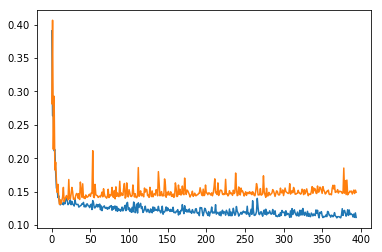

In [26]:
plt.plot(callback_list[1].history['train_loss'][5:])
plt.plot(callback_list[1].history['val_loss'][5:])

In [34]:
checkpoint = torch.load('../results/basenet/checkpoint-v2.pth-best.tar')

## Loading the best model

In [46]:
from cpe775.utils.img_utils import show_landmarks_batch

In [47]:
net

DataParallel (
  (module): BaseNet (
    (features): Sequential (
      (0): Linear (65536 -> 300)
      (1): ReLU (inplace)
    )
    (classifier): Sequential (
      (0): Linear (300 -> 136)
    )
  )
)

In [48]:
net.load_state_dict(checkpoint['state_dict'])

In [49]:
best_net = net

In [50]:
best_model = Model(best_net)

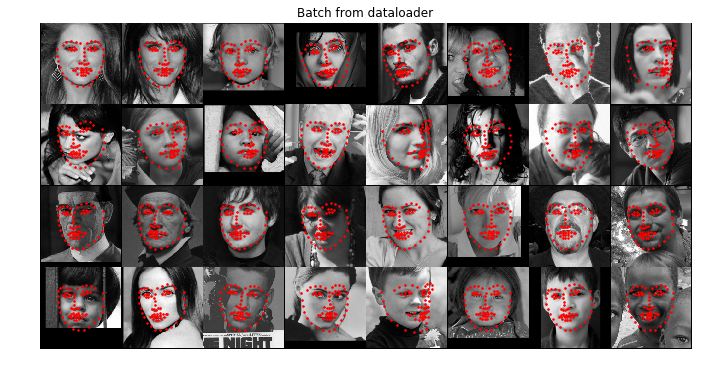

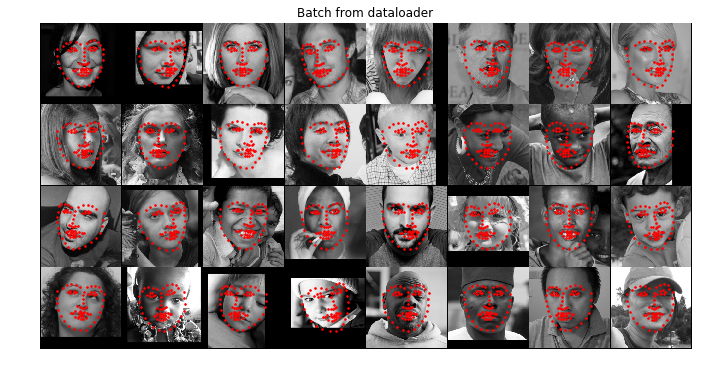

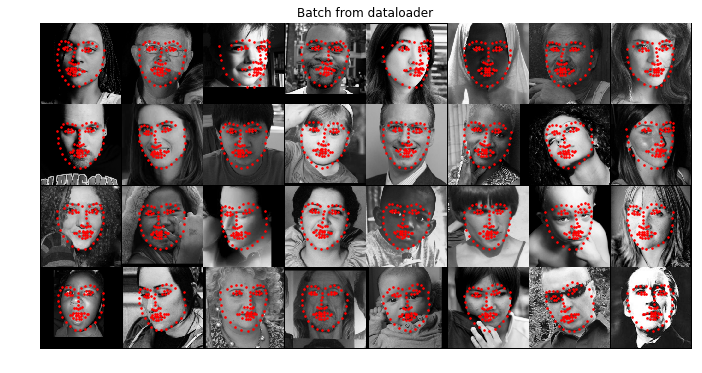

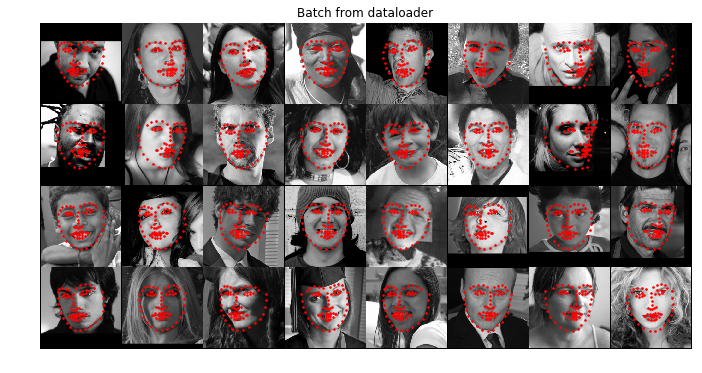

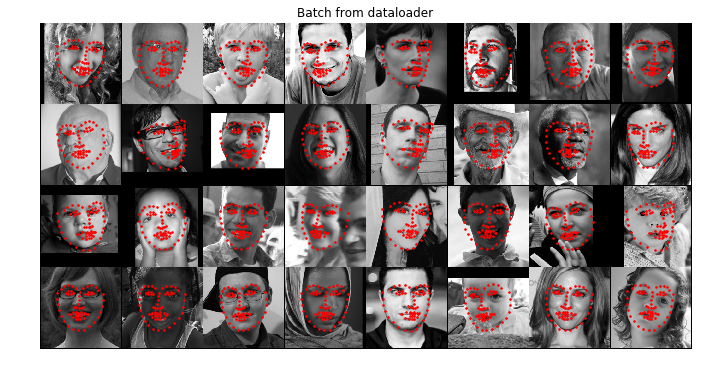

...

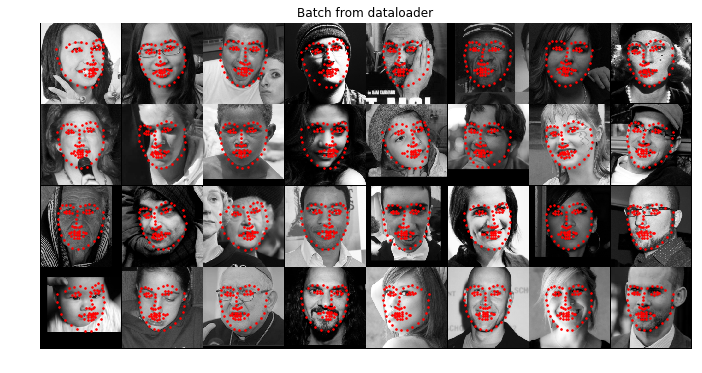

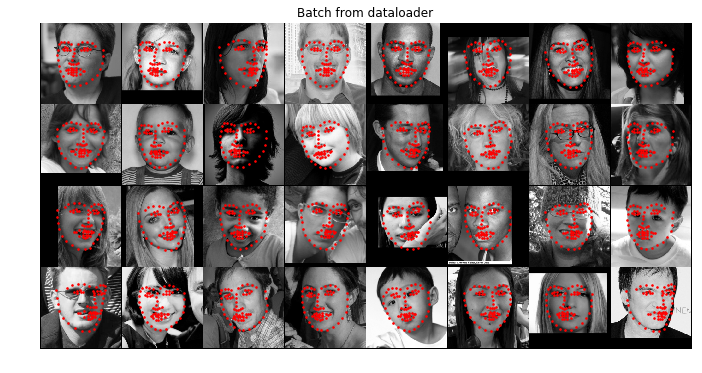

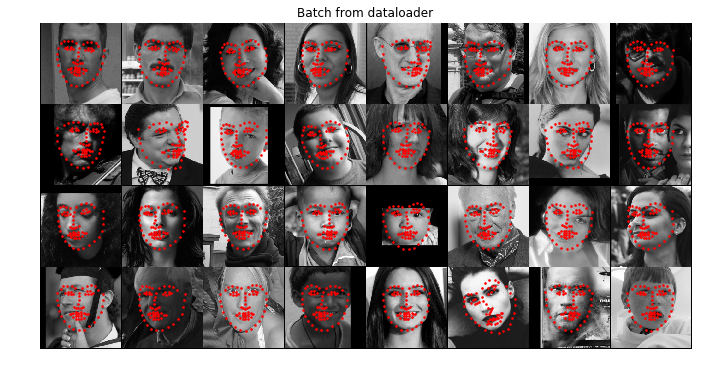

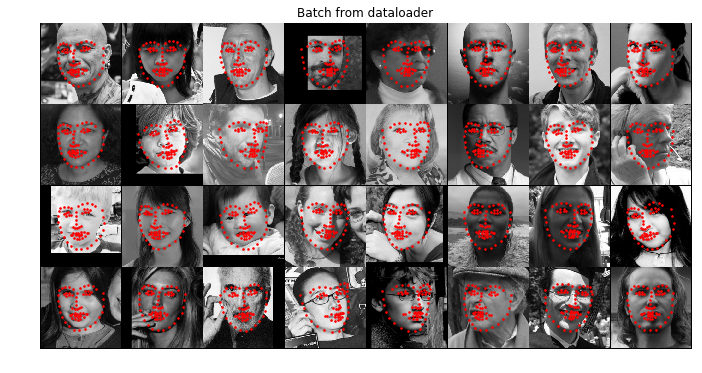

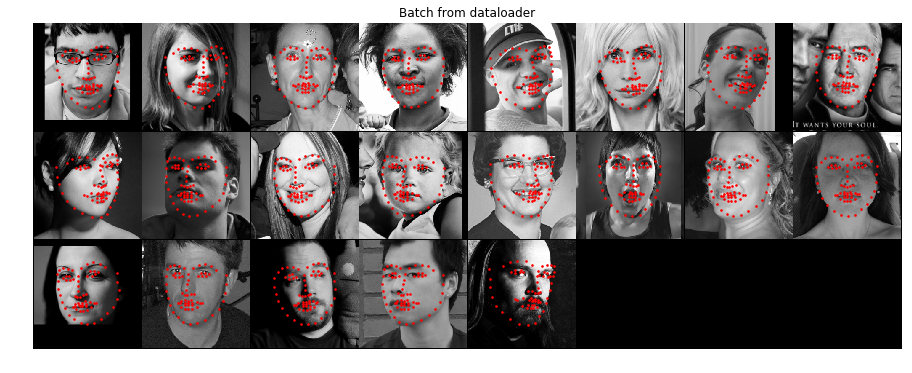

In [53]:
for i_batch, sample_batched in enumerate(valid_loader):
    
    predicted_landmarks = best_net(torch.autograd.Variable(sample_batched['image'], volatile=False)).cpu().data
    plt.figure(figsize=(20,6))
    show_landmarks_batch({'image': sample_batched['image'], 'landmarks': predicted_landmarks})
    plt.axis('off')
    plt.ioff()
    plt.show()

### Common test

In [54]:
# load the dataset
dataset = FaceLandmarksDataset(csv_file='../data/common_test.csv',
                               root_dir='../data/',
                               transform=transforms)

common_loader = torch.utils.data.DataLoader(dataset, 
                batch_size=batch_size, num_workers=4)

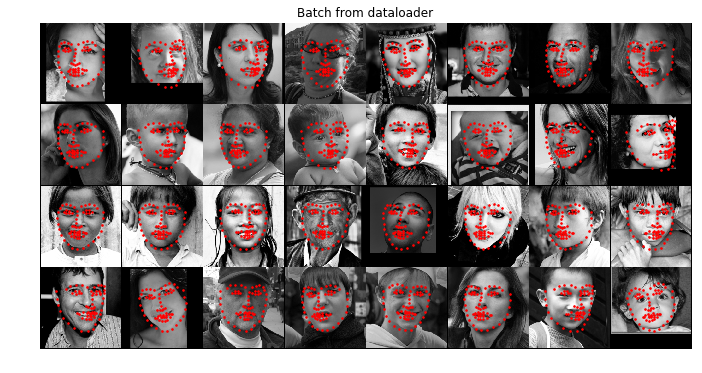

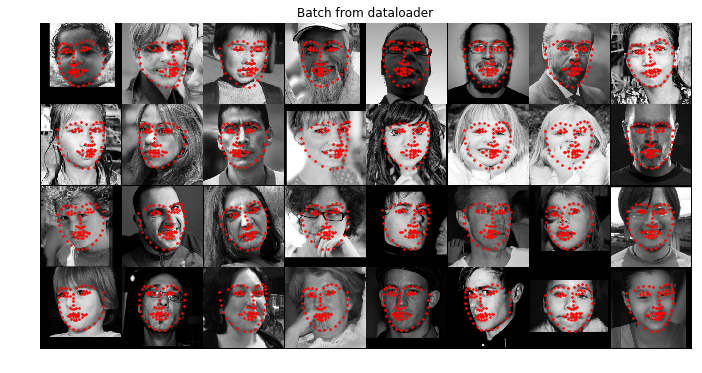

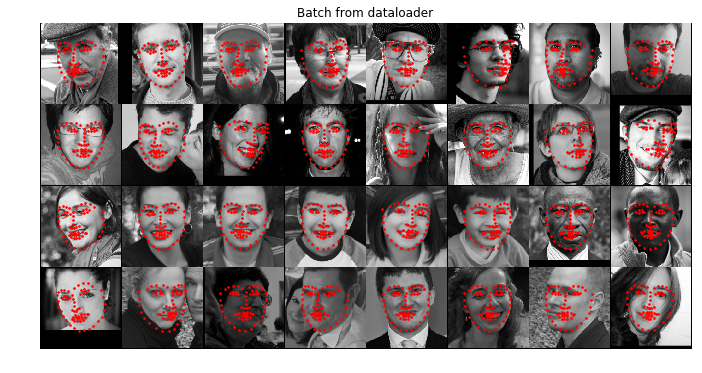

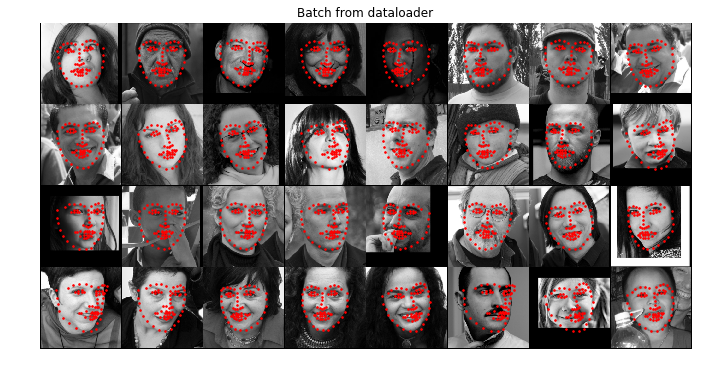

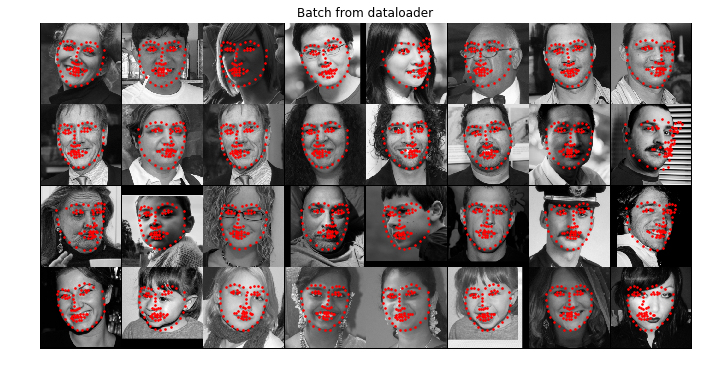

...

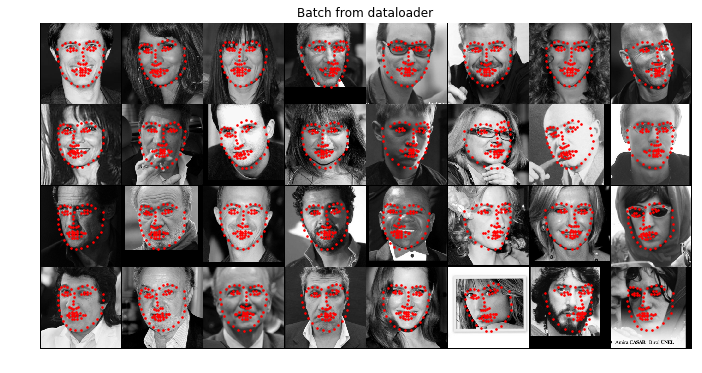

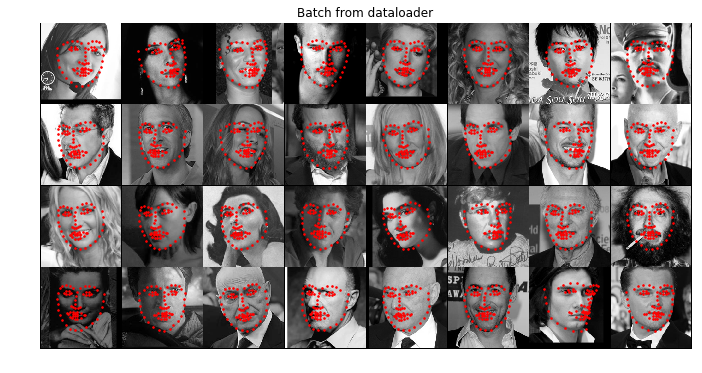

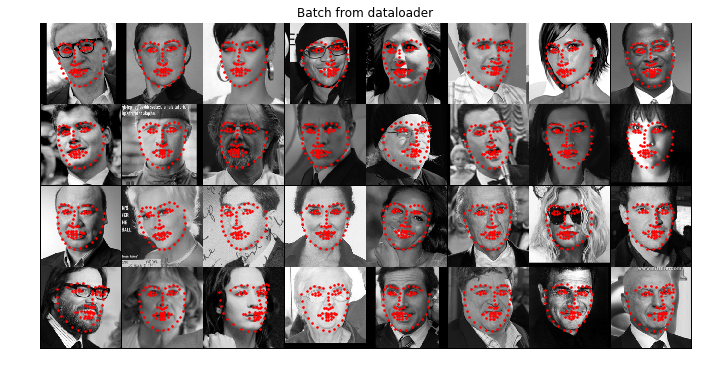

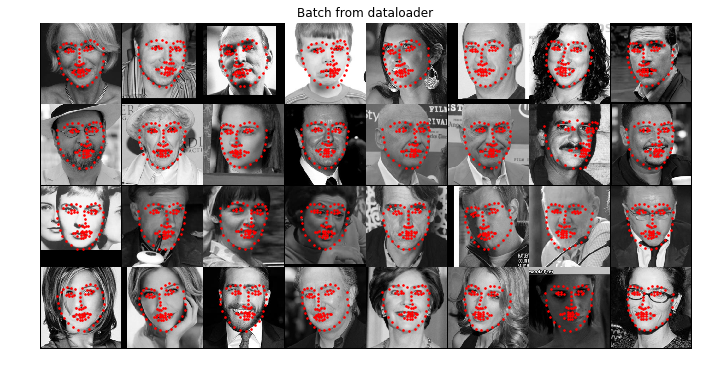

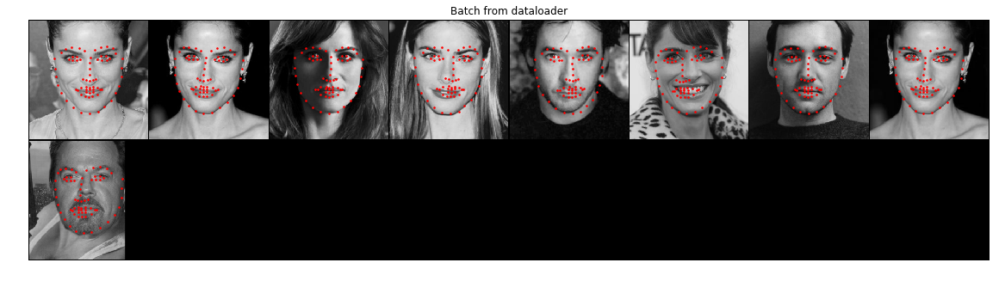

In [56]:
loss = 0
for i_batch, sample_batched in enumerate(common_loader):
    
    predicted_landmarks = best_net(torch.autograd.Variable(sample_batched['image'], volatile=False)).cpu().data
    
    loss += predicted_landmarks.shape[0]*criterion(predicted_landmarks, sample_batched['landmarks'])
    
    plt.figure(figsize=(20,6))
    show_landmarks_batch({'image': sample_batched['image'], 'landmarks': predicted_landmarks})
    plt.axis('off')
    plt.ioff()
    plt.show()

In [61]:
loss/len(dataset)

0.11791465695523008

### Challenging test

In [62]:
# load the dataset
challenging_set = FaceLandmarksDataset(csv_file='../data/challenging_test.csv',
                               root_dir='../data/',
                               transform=transforms)

challeging_loader = torch.utils.data.DataLoader(challenging_set, 
                batch_size=batch_size, num_workers=4)

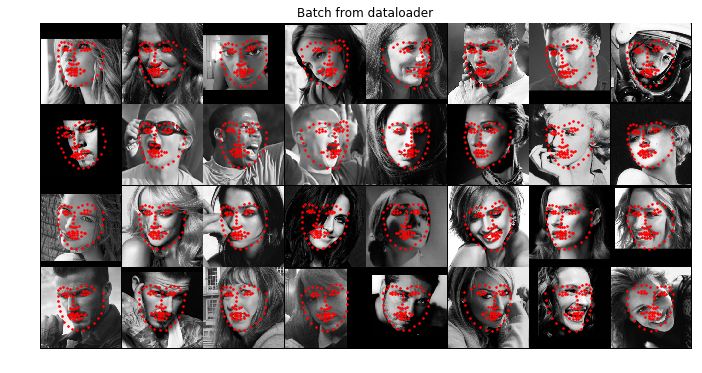

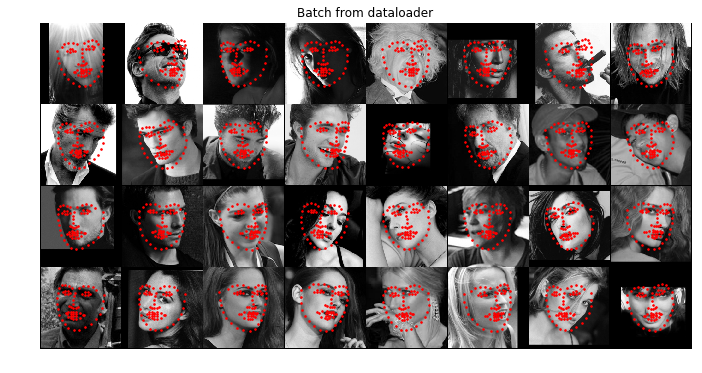

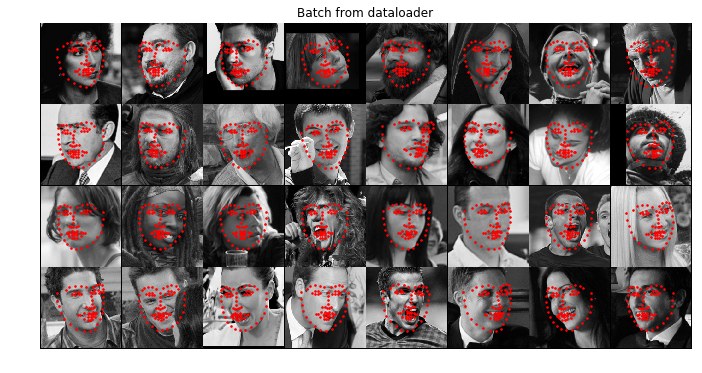

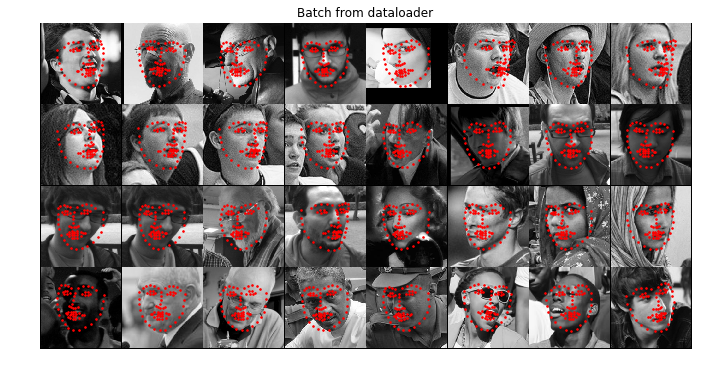

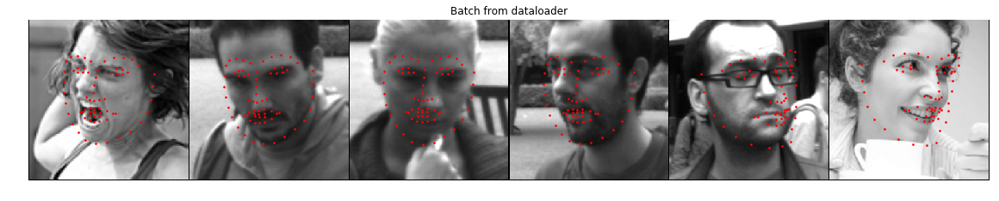

In [63]:
loss = 0
for i_batch, sample_batched in enumerate(challeging_loader):
    
    predicted_landmarks = best_net(torch.autograd.Variable(sample_batched['image'], volatile=False)).cpu().data
    
    loss += predicted_landmarks.shape[0]*criterion(predicted_landmarks, sample_batched['landmarks'])
    
    plt.figure(figsize=(20,6))
    show_landmarks_batch({'image': sample_batched['image'], 'landmarks': predicted_landmarks})
    plt.axis('off')
    plt.ioff()
    plt.show()

In [64]:
loss/len(challenging_set)

0.2533978289966263

In [71]:
np.sum([v.numel() for v in net.parameters()])

19702036